In [2]:
# Block 0: imports, image, helpers (run once)
import os
os.makedirs("results", exist_ok=True)
import math
import torch
import torch.nn.functional as F
import torchvision.transforms as T
import matplotlib.pyplot as plt
import numpy as np
from skimage import data
from PIL import Image

device = "cuda" if torch.cuda.is_available() else "cpu"

# Optional LPIPS
import lpips
lpips_fn = lpips.LPIPS(net="alex").to(device)

def load_rgb01():
    img = Image.fromarray(data.astronaut())
    x = T.ToTensor()(img).unsqueeze(0)  # [1,3,H,W] in [0,1]
    return x.to(device)

def psnr(ref, out, eps=1e-12):
    mse = F.mse_loss(out, ref)
    return float(10.0 * torch.log10(1.0 / (mse + eps)))

def lpips_score(ref, out):
    if lpips_fn is None:
        return None
    with torch.no_grad():
        return float(lpips_fn(ref * 2 - 1, out * 2 - 1).mean().item())

# Noise models
def add_awgn(x, sigma=0.05):
    return (x + sigma * torch.randn_like(x)).clamp(0, 1)

def add_salt_pepper(x, amount=0.02):
    prob = torch.rand_like(x)
    y = x.clone()
    y[prob < amount / 2] = 0.0
    y[(prob >= amount / 2) & (prob < amount)] = 1.0
    return y

# PSF and blur
def gaussian_kernel_2d(size=15, std=3.0):
    ax = np.arange(size) - (size - 1) / 2.0
    xx, yy = np.meshgrid(ax, ax)
    k = np.exp(-(xx**2 + yy**2) / (2.0 * std**2))
    k = k / k.sum()
    return k.astype(np.float32)

def convolve_circular(x, kernel_np):
    k = torch.from_numpy(kernel_np).to(x.device, dtype=x.dtype).unsqueeze(0).unsqueeze(0)
    pad = kernel_np.shape[0] // 2
    out = torch.zeros_like(x)
    for c in range(x.shape[1]):
        ch = x[:, c:c+1]
        chp = F.pad(ch, (pad, pad, pad, pad), mode="circular")
        out[:, c:c+1] = F.conv2d(chp, k, padding=0)
    return out

# FFT helpers and deconvolution
def padded_psf_fft(kernel_np, shape_hw, device):
    hk, wk = kernel_np.shape
    H, W = shape_hw
    pad = torch.zeros((H, W), dtype=torch.float32, device=device)
    pad[:hk, :wk] = torch.from_numpy(kernel_np).to(device)
    pad = torch.roll(pad, shifts=(-hk//2, -wk//2), dims=(0, 1))
    return torch.fft.fft2(pad)

def inverse_filter(x, kernel_np, eps=1e-3):
    B, C, H, W = x.shape
    K = padded_psf_fft(kernel_np, (H, W), x.device)
    out = torch.zeros_like(x)
    denom = K + eps
    for c in range(C):
        Xf = torch.fft.fft2(x[:, c])
        rec = torch.fft.ifft2(Xf / denom)
        out[:, c] = torch.real(rec)
    return out.clamp(0, 1)

def wiener_filter(x, kernel_np, Kreg=1e-3):
    B, C, H, W = x.shape
    K = padded_psf_fft(kernel_np, (H, W), x.device)
    Hf = torch.conj(K) / (torch.abs(K)**2 + Kreg)
    out = torch.zeros_like(x)
    for c in range(C):
        Xf = torch.fft.fft2(x[:, c])
        rec = torch.fft.ifft2(Hf * Xf)
        out[:, c] = torch.real(rec)
    return out.clamp(0, 1)

x_clean = load_rgb01()
print("Image loaded on", device, "shape:", list(x_clean.shape))

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


d:\Programmi\Python\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\Programmi\Python\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: d:\Programmi\Python\Lib\site-packages\lpips\weights\v0.1\alex.pth
Image loaded on cpu shape: [1, 3, 512, 512]


Mild Blur (size=7, std=1.5) - PSNR: 26.31, LPIPS: 0.253
Moderate Blur (size=15, std=3.0) - PSNR: 22.34, LPIPS: 0.441
Strong Blur (size=25, std=5.0) - PSNR: 19.86, LPIPS: 0.576


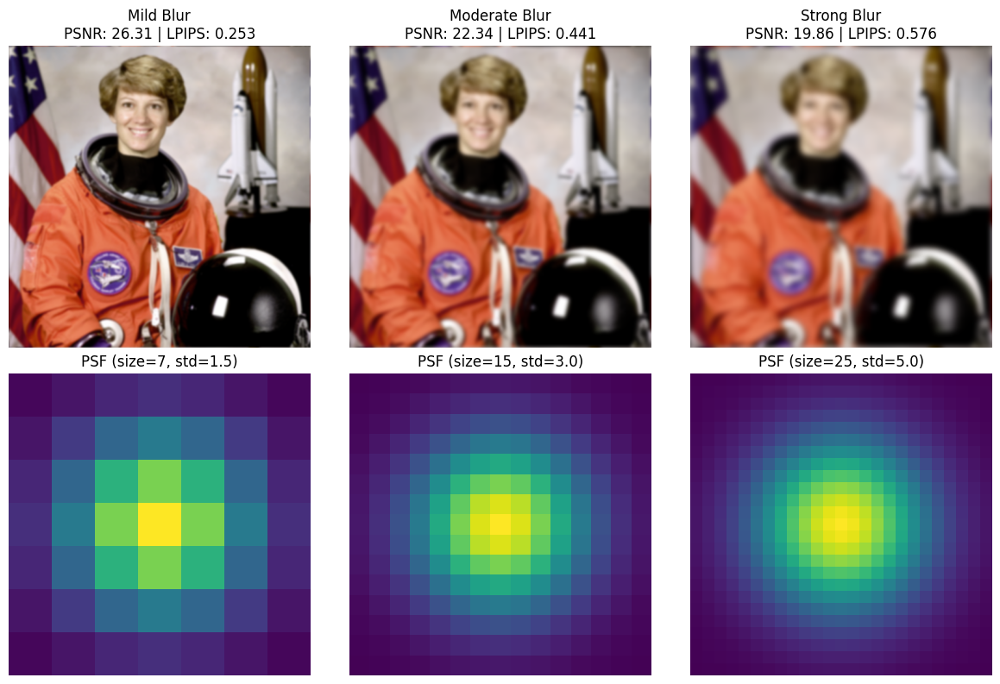


Stored variables for subsequent processing:
- blurred_images: ['Mild Blur', 'Moderate Blur', 'Strong Blur']
- blurred_psfs: ['Mild Blur', 'Moderate Blur', 'Strong Blur']
- blurred_metrics: Available for each blur level


In [5]:
# Block 1: create 3 different blur level images and store them for subsequent processing
blur_levels = [
    {'k_size': 7, 'k_std': 1.5, 'name': 'Mild Blur'},
    {'k_size': 15, 'k_std': 3.0, 'name': 'Moderate Blur'},
    {'k_size': 25, 'k_std': 5.0, 'name': 'Strong Blur'}
]

# Create dictionaries to store the blurred images and their PSFs
blurred_images = {}
blurred_psfs = {}
blurred_metrics = {}

plt.figure(figsize=(12, 8))

for i, blur_config in enumerate(blur_levels):
    k_size = blur_config['k_size']
    k_std = blur_config['k_std']
    k_np = gaussian_kernel_2d(size=k_size, std=k_std)
    xb = convolve_circular(x_clean, k_np)
    psnr_val = psnr(x_clean, xb)
    lpips_val = lpips_score(x_clean, xb)
    
    # Store the blurred image, PSF, and metrics
    blurred_images[blur_config['name']] = xb
    blurred_psfs[blur_config['name']] = k_np
    blurred_metrics[blur_config['name']] = {'psnr': psnr_val, 'lpips': lpips_val}
    
    print(f"{blur_config['name']} (size={k_size}, std={k_std:.1f}) - PSNR: {psnr_val:.2f}, LPIPS: {lpips_val:.3f}")
    
    # Plot blurred image
    plt.subplot(2, 3, i+1)
    plt.imshow(xb[0].permute(1, 2, 0).cpu())
    plt.axis("off")
    plt.title(f"{blur_config['name']}\nPSNR: {psnr_val:.2f} | LPIPS: {lpips_val:.3f}")
    
    # Plot corresponding PSF
    plt.subplot(2, 3, i+4)
    plt.imshow(k_np, vmin=0, vmax=k_np.max())
    plt.axis("off")
    plt.title(f"PSF (size={k_size}, std={k_std:.1f})")

# # Plot clean image separately
# plt.subplot(2, 3, 4)
# plt.imshow(x_clean[0].permute(1, 2, 0).cpu())
# plt.axis("off")
# plt.title("Clean Reference")

plt.tight_layout()
plt.savefig("results/lab1b/multiple_blur_levels.png", dpi=200)
plt.show()
plt.close()

# Print confirmation of stored variables
print(f"\nStored variables for subsequent processing:")
print(f"- blurred_images: {list(blurred_images.keys())}")
print(f"- blurred_psfs: {list(blurred_psfs.keys())}")
print(f"- blurred_metrics: Available for each blur level")

Mild Blur - σ=0.01 - PSNR: 26.14, LPIPS: 0.217
Mild Blur - σ=0.05 - PSNR: 23.35, LPIPS: 0.462


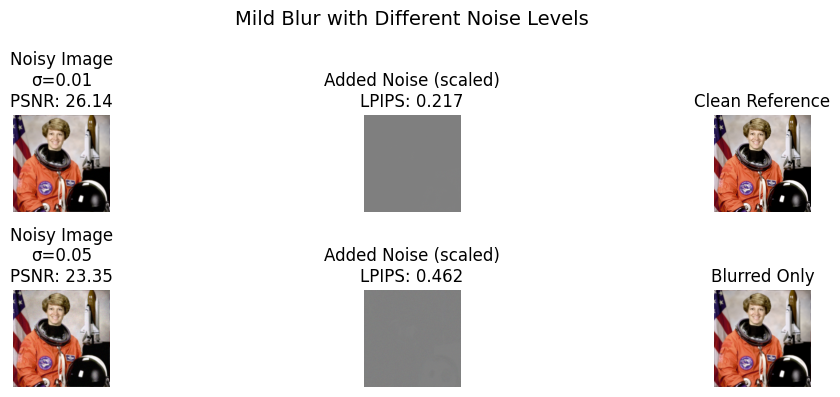

Moderate Blur - σ=0.01 - PSNR: 22.27, LPIPS: 0.400
Moderate Blur - σ=0.05 - PSNR: 20.89, LPIPS: 0.656


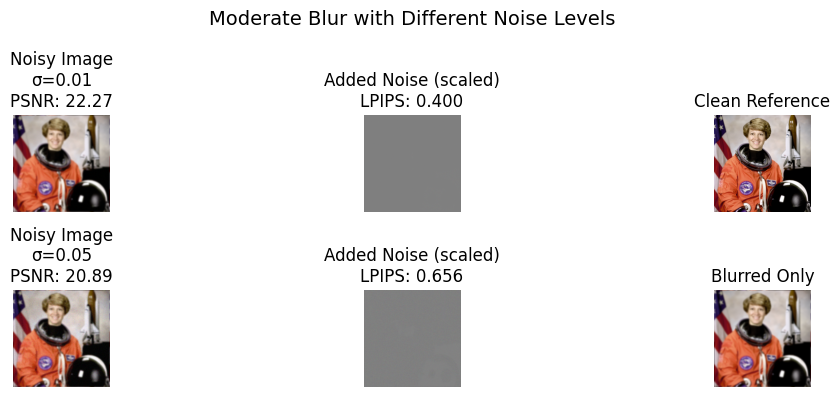

Strong Blur - σ=0.01 - PSNR: 19.82, LPIPS: 0.536
Strong Blur - σ=0.05 - PSNR: 18.97, LPIPS: 0.804


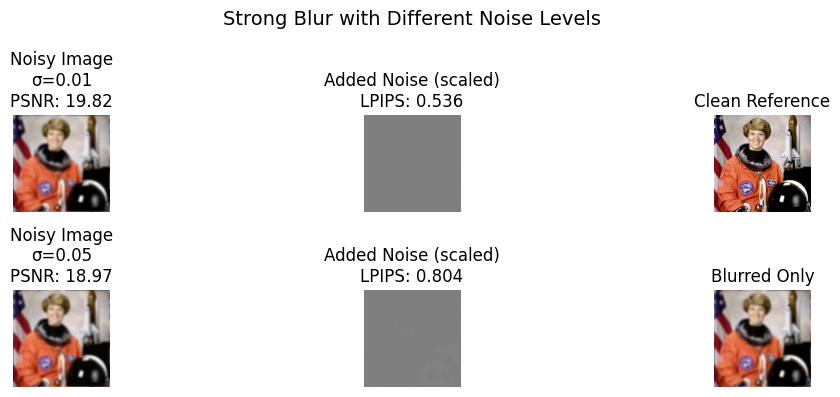

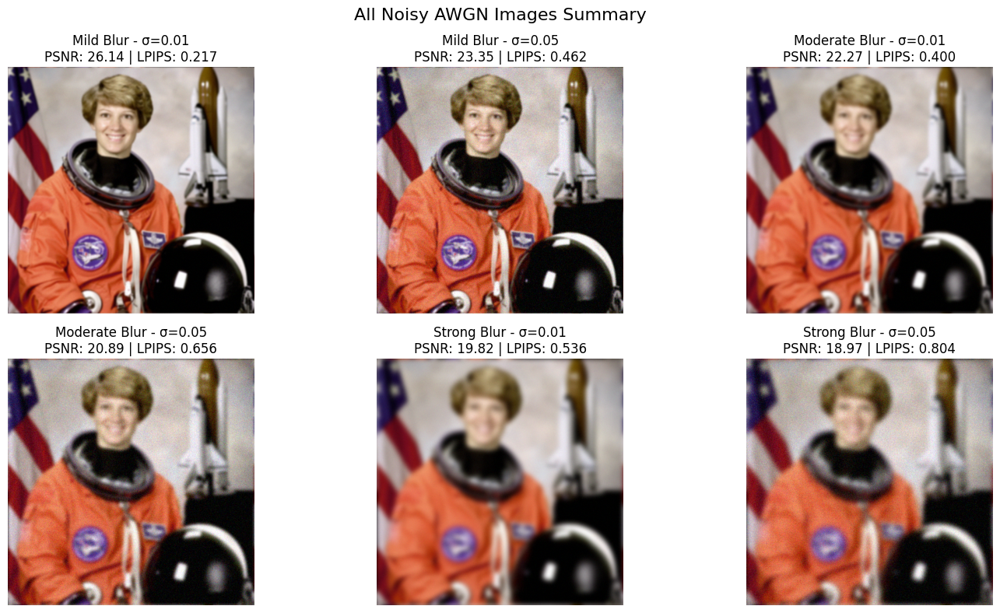


Stored variables for subsequent processing:
- blurred_images: ['Mild Blur', 'Moderate Blur', 'Strong Blur']
- noisy_images: ['Mild Blur - σ=0.01', 'Mild Blur - σ=0.05', 'Moderate Blur - σ=0.01', 'Moderate Blur - σ=0.05', 'Strong Blur - σ=0.01', 'Strong Blur - σ=0.05']
- blurred_psfs: ['Mild Blur', 'Moderate Blur', 'Strong Blur']
- Metrics available for all images


In [10]:
# Block 2: add two different levels of AWGN to the previous blurred images and store them
sigma_levels = [0.01, 0.05]  # Two different noise levels

# Create dictionaries to store the noisy images and their metrics
noisy_images = {}
noisy_metrics = {}

# Create separate plots for each blur level
for blur_name, xb in blurred_images.items():
    plt.figure(figsize=(12, 4))
    
    for j, sigma in enumerate(sigma_levels):
        # Add AWGN to the blurred image
        y = add_awgn(xb, sigma=sigma)
        psnr_val = psnr(x_clean, y)
        lpips_val = lpips_score(x_clean, y)
        
        # Store the noisy image and metrics
        key = f"{blur_name} - σ={sigma}"
        noisy_images[key] = y
        noisy_metrics[key] = {'psnr': psnr_val, 'lpips': lpips_val}
        
        print(f"{key} - PSNR: {psnr_val:.2f}, LPIPS: {lpips_val:.3f}")
        
        # Plot noisy image
        plt.subplot(2, 3, j * 3 + 1)
        plt.imshow(y[0].permute(1, 2, 0).cpu())
        plt.axis("off")
        plt.title(f"Noisy Image\nσ={sigma:.2f}\nPSNR: {psnr_val:.2f}")
        
        # Plot added noise (scaled)
        plt.subplot(2, 3, j * 3 + 2)
        noise_vis = (y - xb)[0].permute(1, 2, 0).cpu() * 0.5 + 0.5
        plt.imshow(noise_vis)
        plt.axis("off")
        plt.title(f"Added Noise (scaled)\nLPIPS: {lpips_val:.3f}")
    
    # Plot clean and blurred references
    plt.subplot(2, 3, 3)
    plt.imshow(x_clean[0].permute(1, 2, 0).cpu())
    plt.axis("off")
    plt.title("Clean Reference")
    
    plt.subplot(2, 3, 6)
    plt.imshow(xb[0].permute(1, 2, 0).cpu())
    plt.axis("off")
    plt.title("Blurred Only")
    
    plt.suptitle(f"{blur_name} with Different Noise Levels", fontsize=14)
    plt.tight_layout()
    plt.savefig(f"results/lab1b/{blur_name.lower().replace(' ', '_')}_noise_levels.png", dpi=200)
    plt.show()
    plt.close()

# Create a summary figure with all noisy images
plt.figure(figsize=(15, 8))
for i, (key, y) in enumerate(noisy_images.items()):
    plt.subplot(2, 3, i + 1)
    plt.imshow(y[0].permute(1, 2, 0).cpu())
    plt.axis("off")
    psnr_val = noisy_metrics[key]['psnr']
    lpips_val = noisy_metrics[key]['lpips']
    plt.title(f"{key}\nPSNR: {psnr_val:.2f} | LPIPS: {lpips_val:.3f}")


plt.suptitle("All Noisy AWGN Images Summary", fontsize=16)
plt.tight_layout()
plt.savefig("results/lab1b/all_noisy_images_summary.png", dpi=200)
plt.show()
plt.close()

# Print confirmation of stored variables
print(f"\nStored variables for subsequent processing:")
print(f"- blurred_images: {list(blurred_images.keys())}")
print(f"- noisy_images: {list(noisy_images.keys())}")
print(f"- blurred_psfs: {list(blurred_psfs.keys())}")
print(f"- Metrics available for all images")

Mild Blur - SP=0.02 - PSNR: 20.31, LPIPS: 0.641
Mild Blur - SP=0.1 - PSNR: 14.25, LPIPS: 1.016


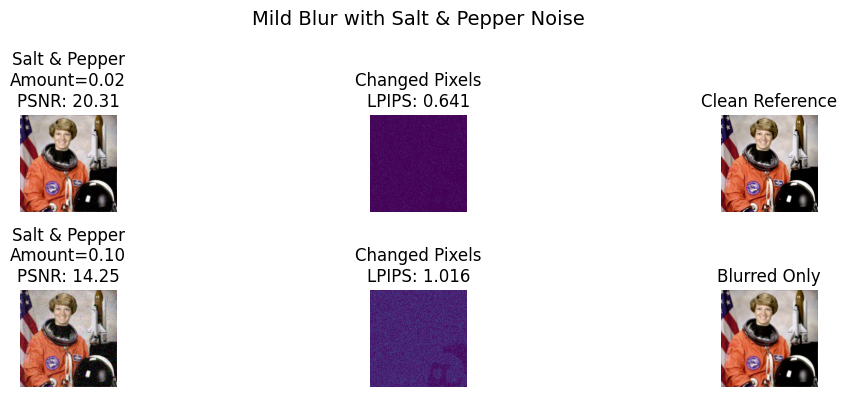

Moderate Blur - SP=0.02 - PSNR: 18.93, LPIPS: 0.780
Moderate Blur - SP=0.1 - PSNR: 13.94, LPIPS: 1.120


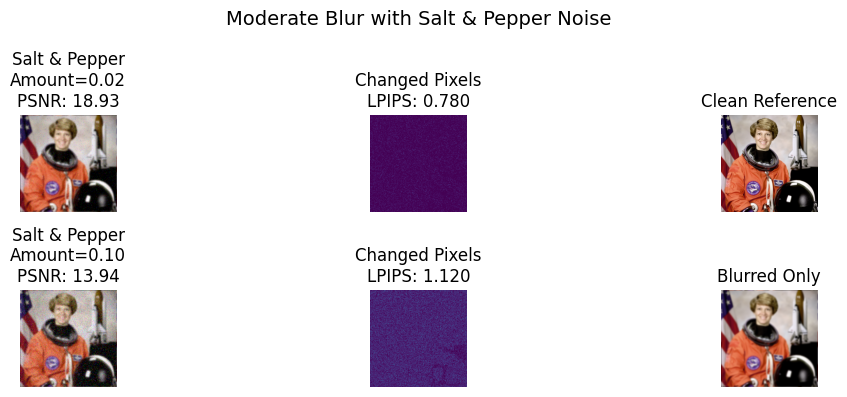

Strong Blur - SP=0.02 - PSNR: 17.63, LPIPS: 0.885
Strong Blur - SP=0.1 - PSNR: 13.49, LPIPS: 1.193


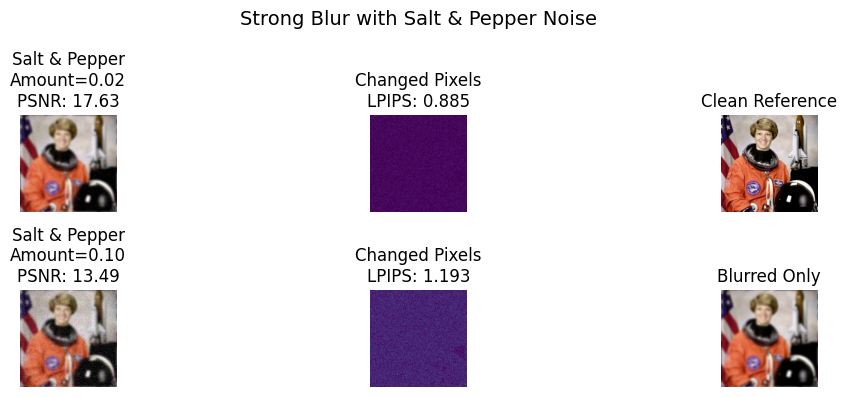

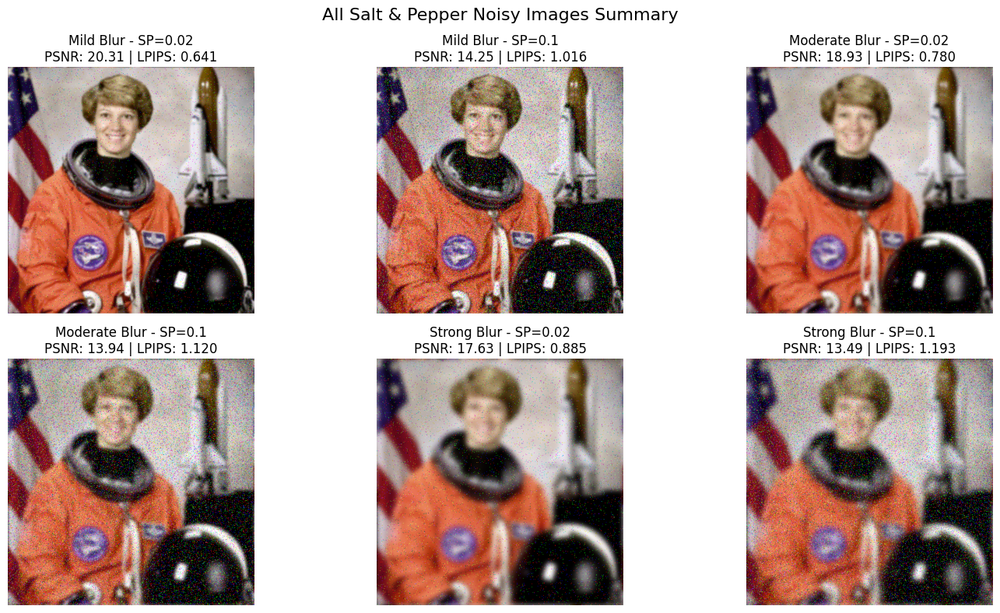


Stored variables for subsequent processing:
- blurred_images: ['Mild Blur', 'Moderate Blur', 'Strong Blur']
- noisy_images (AWGN): ['Mild Blur - σ=0.01', 'Mild Blur - σ=0.05', 'Moderate Blur - σ=0.01', 'Moderate Blur - σ=0.05', 'Strong Blur - σ=0.01', 'Strong Blur - σ=0.05']
- sp_noisy_images (Salt & Pepper): ['Mild Blur - SP=0.02', 'Mild Blur - SP=0.1', 'Moderate Blur - SP=0.02', 'Moderate Blur - SP=0.1', 'Strong Blur - SP=0.02', 'Strong Blur - SP=0.1']
- blurred_psfs: ['Mild Blur', 'Moderate Blur', 'Strong Blur']
- Metrics available for all image types


In [12]:
# Block 3: add two different levels of salt-and-pepper noise to the previous blurred images and store them
amount_levels = [0.02, 0.10]  # Two different noise levels

# Create dictionaries to store the salt-and-pepper noisy images and their metrics
sp_noisy_images = {}
sp_noisy_metrics = {}

# Create separate plots for each blur level
for blur_name, xb in blurred_images.items():
    plt.figure(figsize=(12, 4))
    
    for j, amount in enumerate(amount_levels):
        # Add salt-and-pepper noise to the blurred image
        y_salt = add_salt_pepper(xb, amount=amount)
        psnr_val = psnr(x_clean, y_salt)
        lpips_val = lpips_score(x_clean, y_salt)
        
        # Store the noisy image and metrics
        key = f"{blur_name} - SP={amount}"
        sp_noisy_images[key] = y_salt
        sp_noisy_metrics[key] = {'psnr': psnr_val, 'lpips': lpips_val}
        
        print(f"{key} - PSNR: {psnr_val:.2f}, LPIPS: {lpips_val:.3f}")
        
        # Plot noisy image
        plt.subplot(2, 3, j * 3 + 1)
        plt.imshow(y_salt[0].permute(1, 2, 0).cpu())
        plt.axis("off")
        plt.title(f"Salt & Pepper\nAmount={amount:.2f}\nPSNR: {psnr_val:.2f}")
        
        # Plot changed pixels
        plt.subplot(2, 3, j * 3 + 2)
        changed_pixels = (y_salt != xb).float()[0].mean(0).cpu()
        plt.imshow(changed_pixels, vmin=0, vmax=1)
        plt.axis("off")
        plt.title(f"Changed Pixels\nLPIPS: {lpips_val:.3f}")
    
    # Plot clean and blurred references
    plt.subplot(2, 3, 3)
    plt.imshow(x_clean[0].permute(1, 2, 0).cpu())
    plt.axis("off")
    plt.title("Clean Reference")
    
    plt.subplot(2, 3, 6)
    plt.imshow(xb[0].permute(1, 2, 0).cpu())
    plt.axis("off")
    plt.title("Blurred Only")
    
    plt.suptitle(f"{blur_name} with Salt & Pepper Noise", fontsize=14)
    plt.tight_layout()
    plt.savefig(f"results/lab1b/{blur_name.lower().replace(' ', '_')}_salt_pepper.png", dpi=200)
    plt.show()
    plt.close()

# Create a summary figure with all salt-and-pepper noisy images
plt.figure(figsize=(15, 8))
for i, (key, y_salt) in enumerate(sp_noisy_images.items()):
    plt.subplot(2, 3, i + 1)
    plt.imshow(y_salt[0].permute(1, 2, 0).cpu())
    plt.axis("off")
    psnr_val = sp_noisy_metrics[key]['psnr']
    lpips_val = sp_noisy_metrics[key]['lpips']
    plt.title(f"{key}\nPSNR: {psnr_val:.2f} | LPIPS: {lpips_val:.3f}")



plt.suptitle("All Salt & Pepper Noisy Images Summary", fontsize=16)
plt.tight_layout()
plt.savefig("results/lab1b/all_salt_pepper_summary.png", dpi=200)
plt.show()
plt.close()

# Print confirmation of stored variables
print(f"\nStored variables for subsequent processing:")
print(f"- blurred_images: {list(blurred_images.keys())}")
print(f"- noisy_images (AWGN): {list(noisy_images.keys())}")
print(f"- sp_noisy_images (Salt & Pepper): {list(sp_noisy_images.keys())}")
print(f"- blurred_psfs: {list(blurred_psfs.keys())}")
print(f"- Metrics available for all image types")

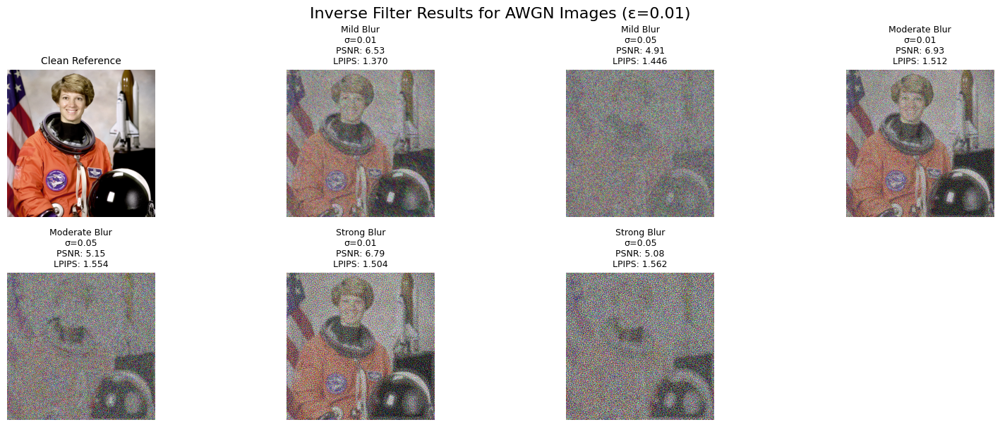

Mild Blur - SP=0.02 - ε=0.01
Mild Blur - SP=0.1 - ε=0.01
Moderate Blur - SP=0.02 - ε=0.01
Moderate Blur - SP=0.1 - ε=0.01
Strong Blur - SP=0.02 - ε=0.01
Strong Blur - SP=0.1 - ε=0.01


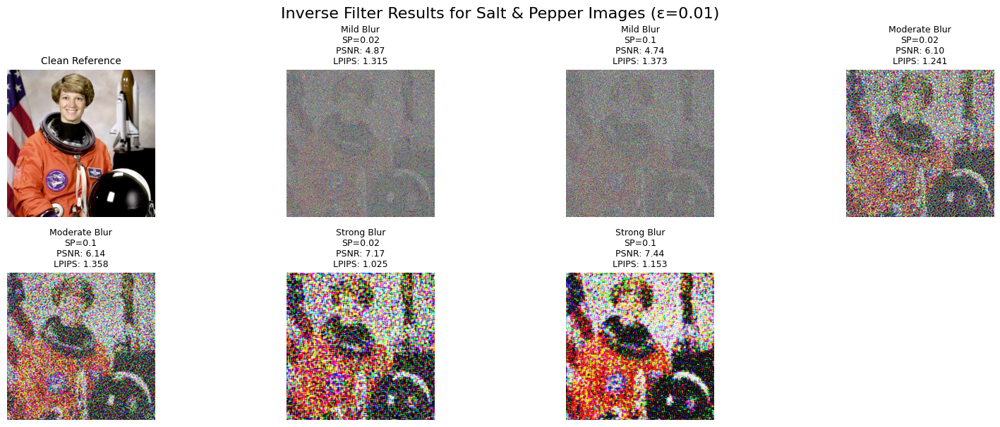

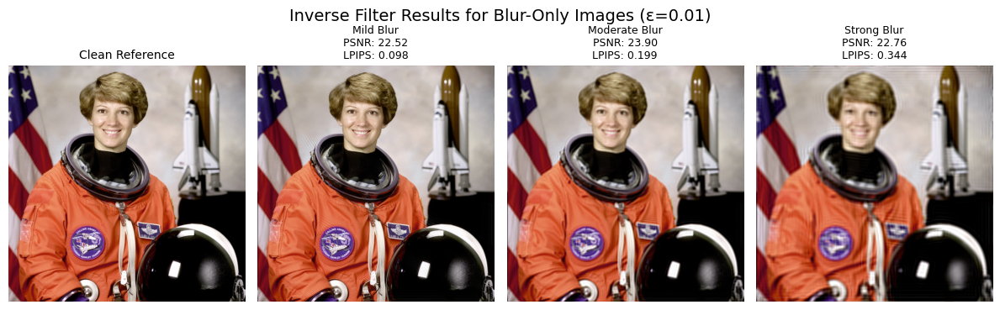


Separate visualizations created:
- AWGN images: results/lab1b/inverse_awgn_images_eps_0.01.png
- Salt & Pepper images: results/lab1b/inverse_sp_images_eps_0.01.png
- Blur-only images: results/lab1b/inverse_blur_only_eps_0.01.png


In [22]:
# Create separate visualizations for AWGN and salt & pepper images with 4 columns

# Visualization for AWGN images
awgn_keys = [k for k in inverse_results.keys() if 'σ=' in k]
plt.figure(figsize=(16, 12))

# Plot clean reference
plt.subplot(4, 4, 1)
plt.imshow(x_clean[0].permute(1, 2, 0).cpu())
plt.axis("off")
plt.title("Clean Reference", fontsize=10)

# Plot AWGN inverse filter results
for i, result_key in enumerate(awgn_keys):
    rec = inverse_results[result_key]
    plt.subplot(4, 4, i + 2)  # +2 to skip the clean reference position
    
    plt.imshow(rec[0].permute(1, 2, 0).cpu())
    plt.axis("off")
    
    psnr_val = inverse_metrics[result_key]['psnr']
    lpips_val = inverse_metrics[result_key]['lpips']
    
    # Extract noise level from key
    noise_level = "σ=0.01" if "σ=0.01" in result_key else "σ=0.05"
    blur_level = result_key.split(' - ')[0]
    
    plt.title(f"{blur_level}\n{noise_level}\nPSNR: {psnr_val:.2f}\nLPIPS: {lpips_val:.3f}", fontsize=9)

plt.suptitle(f"Inverse Filter Results for AWGN Images (ε={eps})", fontsize=16)
plt.tight_layout()
plt.savefig(f"results/lab1b/inverse_awgn_images_eps_{eps}.png", dpi=200, bbox_inches='tight')
plt.show()
plt.close()

# Visualization for salt & pepper images
sp_keys = [k for k in inverse_results.keys() if 'SP=' in k]
plt.figure(figsize=(16, 12))

# Plot clean reference
plt.subplot(4, 4, 1)
plt.imshow(x_clean[0].permute(1, 2, 0).cpu())
plt.axis("off")
plt.title("Clean Reference", fontsize=10)

# Plot salt & pepper inverse filter results
for i, result_key in enumerate(sp_keys):
    rec = inverse_results[result_key]
    plt.subplot(4, 4, i + 2)  # +2 to skip the clean reference position
    
    plt.imshow(rec[0].permute(1, 2, 0).cpu())
    plt.axis("off")
    
    psnr_val = inverse_metrics[result_key]['psnr']
    lpips_val = inverse_metrics[result_key]['lpips']
    print(result_key)
    
    # Extract noise level from key
    noise_level = "SP=0.1" if "SP=0.1" in result_key else "SP=0.02"
    blur_level = result_key.split(' - ')[0]
    
    plt.title(f"{blur_level}\n{noise_level}\nPSNR: {psnr_val:.2f}\nLPIPS: {lpips_val:.3f}", fontsize=9)

plt.suptitle(f"Inverse Filter Results for Salt & Pepper Images (ε={eps})", fontsize=16)
plt.tight_layout()
plt.savefig(f"results/lab1b/inverse_sp_images_eps_{eps}.png", dpi=200, bbox_inches='tight')
plt.show()
plt.close()

# Also create a separate plot for blur-only images for completeness
blur_only_keys = [k for k in inverse_results.keys() if 'σ=' not in k and 'SP=' not in k]
plt.figure(figsize=(12, 4))

# Plot clean reference
plt.subplot(1, 4, 1)
plt.imshow(x_clean[0].permute(1, 2, 0).cpu())
plt.axis("off")
plt.title("Clean Reference", fontsize=10)

# Plot blur-only inverse filter results
for i, result_key in enumerate(blur_only_keys):
    rec = inverse_results[result_key]
    plt.subplot(1, 4, i + 2)
    
    plt.imshow(rec[0].permute(1, 2, 0).cpu())
    plt.axis("off")
    
    psnr_val = inverse_metrics[result_key]['psnr']
    lpips_val = inverse_metrics[result_key]['lpips']
    
    blur_level = result_key.split(' - ')[0]
    plt.title(f"{blur_level}\nPSNR: {psnr_val:.2f}\nLPIPS: {lpips_val:.3f}", fontsize=9)

plt.suptitle(f"Inverse Filter Results for Blur-Only Images (ε={eps})", fontsize=14)
plt.tight_layout()
plt.savefig(f"results/lab1b/inverse_blur_only_eps_{eps}.png", dpi=200, bbox_inches='tight')
plt.show()
plt.close()

print(f"\nSeparate visualizations created:")
print(f"- AWGN images: results/lab1b/inverse_awgn_images_eps_{eps}.png")
print(f"- Salt & Pepper images: results/lab1b/inverse_sp_images_eps_{eps}.png")
print(f"- Blur-only images: results/lab1b/inverse_blur_only_eps_{eps}.png")




Applying Wiener filter to all images with Kreg=0.05

Blur-only images:
Mild Blur - Kreg=0.05 - PSNR: 22.97, LPIPS: 0.205
Moderate Blur - Kreg=0.05 - PSNR: 22.14, LPIPS: 0.386
Strong Blur - Kreg=0.05 - PSNR: 20.51, LPIPS: 0.534

AWGN images:
Mild Blur - σ=0.01 - Kreg=0.05 - PSNR: 22.91, LPIPS: 0.198
Mild Blur - σ=0.05 - Kreg=0.05 - PSNR: 21.86, LPIPS: 0.428
Moderate Blur - σ=0.01 - Kreg=0.05 - PSNR: 22.13, LPIPS: 0.390
Moderate Blur - σ=0.05 - Kreg=0.05 - PSNR: 21.87, LPIPS: 0.528
Strong Blur - σ=0.01 - Kreg=0.05 - PSNR: 20.50, LPIPS: 0.535
Strong Blur - σ=0.05 - Kreg=0.05 - PSNR: 20.44, LPIPS: 0.603

Salt & Pepper images:
Mild Blur - SP=0.02 - Kreg=0.05 - PSNR: 20.25, LPIPS: 0.567
Mild Blur - SP=0.1 - Kreg=0.05 - PSNR: 15.64, LPIPS: 0.761
Moderate Blur - SP=0.02 - Kreg=0.05 - PSNR: 21.32, LPIPS: 0.647
Moderate Blur - SP=0.1 - Kreg=0.05 - PSNR: 18.86, LPIPS: 0.828
Strong Blur - SP=0.02 - Kreg=0.05 - PSNR: 20.22, LPIPS: 0.674
Strong Blur - SP=0.1 - Kreg=0.05 - PSNR: 19.00, LPIPS: 0.813


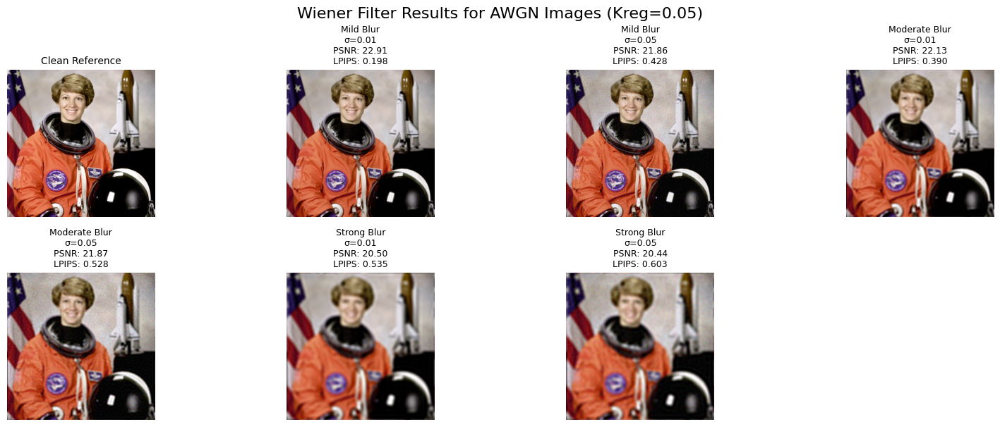

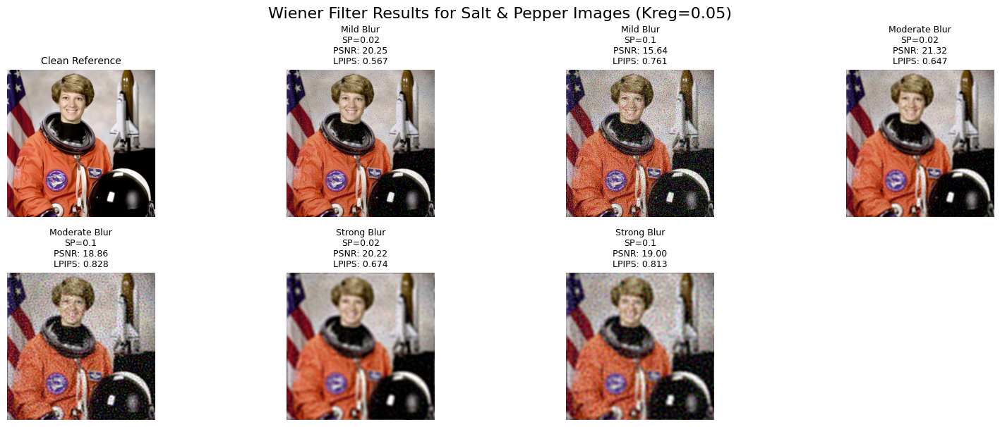

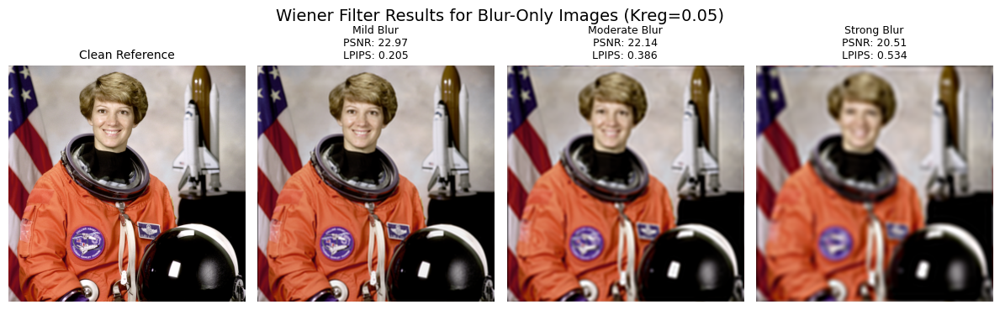


Wiener filtering completed with Kreg=0.05!
Total Wiener results stored: 15
Stored in: wiener_results and wiener_metrics dictionaries

Separate visualizations created:
- AWGN images: results/lab1b/wiener_awgn_images_Kreg_0.05.png
- Salt & Pepper images: results/lab1b/wiener_sp_images_Kreg_0.05.png
- Blur-only images: results/lab1b/wiener_blur_only_Kreg_0.05.png


In [23]:
# Block 5: apply Wiener filter to all images with a single regularization parameter
Kreg = 5e-2  # Single regularization parameter value to use for all Wiener filtering

# Create dictionaries to store all Wiener filter results
wiener_results = {}
wiener_metrics = {}

print(f"Applying Wiener filter to all images with Kreg={Kreg}")

# Apply Wiener filter to blur-only images
print("\nBlur-only images:")
for blur_name, xb in blurred_images.items():
    k_np = blurred_psfs[blur_name]
    rec = wiener_filter(xb, k_np, Kreg=Kreg)
    psnr_val = psnr(x_clean, rec)
    lpips_val = lpips_score(x_clean, rec)
    
    result_key = f"{blur_name} - Kreg={Kreg}"
    wiener_results[result_key] = rec
    wiener_metrics[result_key] = {'psnr': psnr_val, 'lpips': lpips_val}
    print(f"{result_key} - PSNR: {psnr_val:.2f}, LPIPS: {lpips_val:.3f}")

# Apply Wiener filter to AWGN images
print("\nAWGN images:")
for image_key, y in noisy_images.items():
    # Extract blur level from key to get the right PSF
    blur_level = None
    for blur_name in blurred_psfs.keys():
        if blur_name in image_key:
            blur_level = blur_name
            break
    
    if blur_level is not None:
        k_np = blurred_psfs[blur_level]
        rec = wiener_filter(y, k_np, Kreg=Kreg)
        psnr_val = psnr(x_clean, rec)
        lpips_val = lpips_score(x_clean, rec)
        
        result_key = f"{image_key} - Kreg={Kreg}"
        wiener_results[result_key] = rec
        wiener_metrics[result_key] = {'psnr': psnr_val, 'lpips': lpips_val}
        print(f"{result_key} - PSNR: {psnr_val:.2f}, LPIPS: {lpips_val:.3f}")

# Apply Wiener filter to salt & pepper images
print("\nSalt & Pepper images:")
for image_key, y in sp_noisy_images.items():
    # Extract blur level from key to get the right PSF
    blur_level = None
    for blur_name in blurred_psfs.keys():
        if blur_name in image_key:
            blur_level = blur_name
            break
    
    if blur_level is not None:
        k_np = blurred_psfs[blur_level]
        rec = wiener_filter(y, k_np, Kreg=Kreg)
        psnr_val = psnr(x_clean, rec)
        lpips_val = lpips_score(x_clean, rec)
        
        result_key = f"{image_key} - Kreg={Kreg}"
        wiener_results[result_key] = rec
        wiener_metrics[result_key] = {'psnr': psnr_val, 'lpips': lpips_val}
        print(f"{result_key} - PSNR: {psnr_val:.2f}, LPIPS: {lpips_val:.3f}")

# Create separate visualizations for AWGN and salt & pepper images with 4 columns

# Visualization for AWGN images
awgn_keys = [k for k in wiener_results.keys() if 'σ=' in k]
plt.figure(figsize=(16, 12))

# Plot clean reference
plt.subplot(4, 4, 1)
plt.imshow(x_clean[0].permute(1, 2, 0).cpu())
plt.axis("off")
plt.title("Clean Reference", fontsize=10)

# Plot AWGN Wiener filter results
for i, result_key in enumerate(awgn_keys):
    rec = wiener_results[result_key]
    plt.subplot(4, 4, i + 2)  # +2 to skip the clean reference position
    
    plt.imshow(rec[0].permute(1, 2, 0).cpu())
    plt.axis("off")
    
    psnr_val = wiener_metrics[result_key]['psnr']
    lpips_val = wiener_metrics[result_key]['lpips']
    
    # Extract noise level from key
    noise_level = "σ=0.01" if "σ=0.01" in result_key else "σ=0.05"
    blur_level = result_key.split(' - ')[0]
    
    plt.title(f"{blur_level}\n{noise_level}\nPSNR: {psnr_val:.2f}\nLPIPS: {lpips_val:.3f}", fontsize=9)

plt.suptitle(f"Wiener Filter Results for AWGN Images (Kreg={Kreg})", fontsize=16)
plt.tight_layout()
plt.savefig(f"results/lab1b/wiener_awgn_images_Kreg_{Kreg}.png", dpi=200, bbox_inches='tight')
plt.show()
plt.close()

# Visualization for salt & pepper images
sp_keys = [k for k in wiener_results.keys() if 'SP=' in k]
plt.figure(figsize=(16, 12))

# Plot clean reference
plt.subplot(4, 4, 1)
plt.imshow(x_clean[0].permute(1, 2, 0).cpu())
plt.axis("off")
plt.title("Clean Reference", fontsize=10)

# Plot salt & pepper Wiener filter results
for i, result_key in enumerate(sp_keys):
    rec = wiener_results[result_key]
    plt.subplot(4, 4, i + 2)  # +2 to skip the clean reference position
    
    plt.imshow(rec[0].permute(1, 2, 0).cpu())
    plt.axis("off")
    
    psnr_val = wiener_metrics[result_key]['psnr']
    lpips_val = wiener_metrics[result_key]['lpips']
    
    # Extract noise level from key
    noise_level = "SP=0.1" if "SP=0.1" in result_key else "SP=0.02"
    blur_level = result_key.split(' - ')[0]
    
    plt.title(f"{blur_level}\n{noise_level}\nPSNR: {psnr_val:.2f}\nLPIPS: {lpips_val:.3f}", fontsize=9)

plt.suptitle(f"Wiener Filter Results for Salt & Pepper Images (Kreg={Kreg})", fontsize=16)
plt.tight_layout()
plt.savefig(f"results/lab1b/wiener_sp_images_Kreg_{Kreg}.png", dpi=200, bbox_inches='tight')
plt.show()
plt.close()

# Also create a separate plot for blur-only images for completeness
blur_only_keys = [k for k in wiener_results.keys() if 'σ=' not in k and 'SP=' not in k]
plt.figure(figsize=(12, 4))

# Plot clean reference
plt.subplot(1, 4, 1)
plt.imshow(x_clean[0].permute(1, 2, 0).cpu())
plt.axis("off")
plt.title("Clean Reference", fontsize=10)

# Plot blur-only Wiener filter results
for i, result_key in enumerate(blur_only_keys):
    rec = wiener_results[result_key]
    plt.subplot(1, 4, i + 2)
    
    plt.imshow(rec[0].permute(1, 2, 0).cpu())
    plt.axis("off")
    
    psnr_val = wiener_metrics[result_key]['psnr']
    lpips_val = wiener_metrics[result_key]['lpips']
    
    blur_level = result_key.split(' - ')[0]
    plt.title(f"{blur_level}\nPSNR: {psnr_val:.2f}\nLPIPS: {lpips_val:.3f}", fontsize=9)

plt.suptitle(f"Wiener Filter Results for Blur-Only Images (Kreg={Kreg})", fontsize=14)
plt.tight_layout()
plt.savefig(f"results/lab1b/wiener_blur_only_Kreg_{Kreg}.png", dpi=200, bbox_inches='tight')
plt.show()
plt.close()

print(f"\nWiener filtering completed with Kreg={Kreg}!")
print(f"Total Wiener results stored: {len(wiener_results)}")
print(f"Stored in: wiener_results and wiener_metrics dictionaries")
print(f"\nSeparate visualizations created:")
print(f"- AWGN images: results/lab1b/wiener_awgn_images_Kreg_{Kreg}.png")
print(f"- Salt & Pepper images: results/lab1b/wiener_sp_images_Kreg_{Kreg}.png")
print(f"- Blur-only images: results/lab1b/wiener_blur_only_Kreg_{Kreg}.png")

In [34]:
# Block 6: quick side-by-side for your current settings
eps_val = eps  # EDIT if desired
Kreg_val = Kreg  # EDIT if desired

rec_inv = inverse_filter(y, k_np, eps=eps_val)
rec_wnr = wiener_filter(y, k_np, Kreg=Kreg_val)

psnr_inv = psnr(x_clean, rec_inv)
lpips_inv = lpips_score(x_clean, rec_inv)
psnr_wnr = psnr(x_clean, rec_wnr)
lpips_wnr = lpips_score(x_clean, rec_wnr)

print("Inverse PSNR:", psnr_inv, "LPIPS:", lpips_inv)
print("Wiener PSNR:", psnr_wnr, "LPIPS:", lpips_wnr)

plt.figure(figsize=(12, 3))
plt.subplot(1, 4, 1)
plt.imshow(x_clean[0].permute(1, 2, 0).cpu())
plt.axis("off")
plt.title("Clean")

plt.subplot(1, 4, 2)
plt.imshow(y[0].permute(1, 2, 0).cpu())
plt.axis("off")
plt.title("Blur+Noise")

plt.subplot(1, 4, 3)
plt.imshow(rec_inv[0].permute(1, 2, 0).cpu())
plt.axis("off")
plt.title(f"Inverse (ε={eps_val})\nPSNR: {psnr_inv:.2f} | LPIPS: {lpips_inv:.3f}")

plt.subplot(1, 4, 4)
plt.imshow(rec_wnr[0].permute(1, 2, 0).cpu())
plt.axis("off")
plt.title(f"Wiener (Kreg={Kreg_val})\nPSNR: {psnr_wnr:.2f} | LPIPS: {lpips_wnr:.3f}")

plt.tight_layout()
plt.savefig("results/lab1b/compare_inv_wiener.png", dpi=200)
plt.close()

Inverse PSNR: 18.546337127685547 LPIPS: 0.6811946630477905
Wiener PSNR: 21.710779190063477 LPIPS: 0.5631399154663086
